# Presence / absence analysis

## Setup


In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%xmode minimal
import os
import re
import sys

Exception reporting mode: Minimal


In [3]:
import logging
import warnings

In [4]:
warnings.simplefilter("ignore")

In [5]:
import numpy as np
import pandas as pd
import hvplot.pandas
import hvplot
import holoviews as hv
from holoviews import opts
from pathlib import Path
import gffutils
import panel as pn
from tqdm import tqdm
import itertools
pd.set_option("plotting.backend", "plotly")
pn.extension("tabulator")

All code that loads, stores and processes data now have been moved to a separate module file for easier development.

In [6]:
from conifer.presabs import load_coverage_data, Coverage, Annotation, PCA, PLSDA, PCAPlotter, CovPlotter, PLSDAPlotter, PCALoadings, PLSDALoadings

### Sample data

In [189]:
CONIFER_HOME = Path(os.environ["CONIFER_HOME"])
SAMPLESETS_DIR = CONIFER_HOME / "resources/samplesets"
MOSDEPTH_DIR = CONIFER_HOME / "data/mosdepth_coverage/MQ10"
SAMPLESHEET_FILE = CONIFER_HOME / "resources/samplesheet.tsv"
MANUSCRIPT_ROOT = Path(os.environ["MANUSCRIPT_ROOT"]) / "mainGenome2024"
MANUSCRIPT_FIGURES = MANUSCRIPT_ROOT / "figures" / "presabs"
MANUSCRIPT_SOURCE_DATA = MANUSCRIPT_ROOT / "source_data"
MANUSCRIPT_FIGSHARE = MANUSCRIPT_ROOT / "figshare"

In [8]:
samplesheet = pd.read_table(SAMPLESHEET_FILE).set_index(["SM"])
samplesheet.index.names = ["sample"]

In [9]:
def read_mosdepth(sample):
    df = pd.read_table(MOSDEPTH_DIR / f"{sample}.mosdepth.summary.txt")
    df["sample"] = sample
    return df[df["chrom"] == "total"][["mean", "sample"]].set_index(["sample"])
mosdepth_coverage = pd.concat([read_mosdepth(sample) for sample in samplesheet.index.values], axis=0)

In [10]:
samplesheet = samplesheet.join(mosdepth_coverage)

In [11]:
samplesheet["batch"] = samplesheet["Scilife-ID"].apply(lambda x: x.split("-")[0] if not isinstance(x, float) else None)

Define function to display and download tables.

In [12]:
def panel_table(df, value, page_size=20, **kwargs):
    tab = pn.widgets.Tabulator(df, page_size=page_size, **kwargs)
    filename, button = tab.download_menu(
        text_kwargs={'name': 'Enter filename', 'value': value},
        button_kwargs={'name': 'Download table'}
    )
    p = pn.Row(
        pn.Column(filename, button),
        tab
    )
    return p

In [13]:
panel_table(samplesheet, value="samplesheet.csv")

Row
    [0] Column
        [0] TextInput(name='Enter filename', value='samplesheet.csv')
        [1] Button(name='Download table')
    [1] Tabulator(page_size=20, pagination='local', value=              ...)

For future processing, store samplesheet as an Annotation object.

In [14]:
ssannot = Annotation(samplesheet)

Also load gene annotation file. First remove duplicates based on `interpro_id` and `eggnog_description`. Then remove based on `gene` index, tacitly choosing the first annotation entry to be correct.

In [15]:
annotation_file = CONIFER_HOME / "data/resources/Picab02_230926_at01_longest_representative_annotations_merged_sorted.tsv.gz"
db = pd.read_table(annotation_file)
db = db.drop_duplicates(subset=["id", "interpro_id", "eggnog_description"])

In [16]:
db["gene"] = db["id"].str.replace(r"\..+$", "", regex=True)
db.set_index(["gene"], inplace=True)
db = db[~db.index.duplicated()]
geneannot = Annotation(db)

## Region data

The input region files are based on the annotation file `Picab02_230926_at01_longest_no_TE_sorted.gff3.gz`. However, this file includes RNA genes, so we load the file `Picab02_230926_at01_longest_no_TE_sorted_CDSonly.gff3.gz` and create a list of gene ids to filter our inputs on.

In [17]:
all_db = gffutils.FeatureDB(CONIFER_HOME / "data/resources/Picab02_230926_at01_longest_no_TE_sorted.liftover.gff3.db")
cds_db = gffutils.FeatureDB(CONIFER_HOME / "data/resources/Picab02_230926_at01_longest_no_TE_sorted_CDSonly.liftover.gff3.db")

In [18]:
all_genes = [x.id for x in all_db.features_of_type("gene")]
cds_genes = [x.id for x in cds_db.features_of_type("gene")]

In [19]:
rna_genes = set(all_genes).difference(cds_genes)

Sanity check of the entries count:

In [20]:
len(all_genes), len(cds_genes), len(rna_genes)

(67326, 43410, 23916)

## Input data

Input data consists of tsv-files grouped by a feature pair (here gene|gene) followed by total coverage and the width of the feature. Sample coverages were computed from an input coverage file in D4 format and the coverage of every position was recoded as 0/1 (absence/presence) based on a coverage threshold (here, coverage <= 3 is encoded as absence) for features defined in feature files located in `data/resources/presabs`. The tsv-files then denote the number of present bases for a feature pair along with the width.

In [21]:
template = CONIFER_HOME / "data/presabs/gene/P15502-102.sum.tsv"
example = pd.read_table(str.format(str(template), sample="P15502-102"), header=None, names=["feature", "coverage", "width"])
example.head()

,feature,coverage,width
0,PA_cUP0115_G000001|PA_cUP0115_G000001,0,5814
1,PA_cUP0115_G000002|PA_cUP0115_G000002,405,13323
2,PA_cUP0115_G000003|PA_cUP0115_G000003,914,1868
3,PA_cUP0115_G000004|PA_cUP0115_G000004,2479,3544
4,PA_cUP0115_G000005|PA_cUP0115_G000005,55658,292386


The regions contain features from unplaced chromosomes. `load_coverage_data` has an option `chrom_regex` that will retain entries of interest (default `PA_chr\d+_P?G`).


## Sample sets

We load all samples by sampleset to create matrices where the columns correspond to samples indexed by `feature/width`. The data is loaded into a `Coverage` object.

The main calculations are based on the north/south samplesets:

In [22]:
ns_samplesets = {
    "north": pd.read_table(SAMPLESETS_DIR / "samples-north.keep.txt").SM.values.tolist(),
    "south": pd.read_table(SAMPLESETS_DIR / "samples-south.keep.txt").SM.values.tolist()
}

In order to generate a null distribution (random background) we also sample 52 samples from the high coverage dataset and randomly assign them to samplesets `north` and `south`.

In [23]:
highcov = pd.read_table(SAMPLESETS_DIR / "samples-highcov.keep.txt").sample(52, random_state=52).SM.values.tolist()
ns_null_samplesets = {
    "north": highcov[:26],
    "south": highcov[26:]
}

Finally, we will generate a PCA over all samples (excluding outgroups) and for high coverage samples.

In [24]:
pabies_sampleset = {"pabies": pd.read_table(SAMPLESETS_DIR / "samples-P.abies.keep.txt").SM.values.tolist()}

In [25]:
highcov_sampleset = {"highcov": pd.read_table(SAMPLESETS_DIR / "samples-highcov.keep.txt").SM.values.tolist()}

## Features


In [26]:
features = ["gene", "CDS", "intron", "TE", "pseudogene", "random"]

## Analyses

For each analysis, we load coverages with `load_coverage_data` for every defined feature type. The `Coverage` class defines convenience functions to analyze input data as raw counts, normalized values (0.0-1.0 range), or discrete encoding. The PCA results are all calculated on the fly and can be plotted as linked plots. The top loadings are provided in a scrollable table.

### North / south comparison

In [27]:
colormap = {"north": "#1F78B4", "south": "#FFFF99"}

In [28]:
results = {}
cdata = {}
samplesets = ns_samplesets
for ft in tqdm(features):    
    if ft == "random":
        samplesets = ns_null_samplesets
    ss = samplesets["north"] + samplesets["south"]
    cdata[ft] = load_coverage_data(samples=ss, feature=ft, home=CONIFER_HOME, gene_filter=rna_genes)
    results[ft] = Coverage(cdata[ft], feature=ft, samplesets=samplesets, annotation=geneannot)

100%|███████████████████████████████████████████████████████████████████████████████████████| 6/6 [03:00<00:00, 30.09s/it]


Sanity check the number of genes (excluding unplaced chromosomes):

In [29]:
results["gene"].data.shape

(39508, 52)

#### Coverage summary

Plot and summarize coverage data by sampleset. 

In [30]:
# Plot distribution of coverages for each sample, color by sampleset or sampleset/samples
cov = results["gene"].normalize()
plots = [CovPlotter(cov=cov, colormap=colormap)]

In [31]:
hv.Layout([p.boxplot(x="sampleset") for p in plots] + [p.boxplot() for p in plots]).opts(shared_axes=False).cols(2)

:Layout
   .Normalized.Gene.I  :BoxWhisker   [sampleset]   (value)
   .Normalized.Gene.II :BoxWhisker   [sampleset,sample]   (value)

In [32]:
hv.Layout([p.hist(by="sampleset", alpha=0.3) for p in plots] + [p.dhist(pair=["north", "south"], bins=100) for p in plots]).opts(shared_axes=False).cols(2)

:Layout
   .NdOverlay.I :NdOverlay   [sampleset]
      :Histogram   [value]   (Count)
   .Histogram.I :Histogram   [diff]   (Count)

Just looking at genes with a mean difference larger than 0.1 shows that there are many more large differences for north-south comparison vs south-north.

In [33]:
sum(cov.mean().diff(axis=1)["south"] < -0.1), sum(cov.mean().diff(axis=1)["south"] > 0.1)

(4084, 1395)

#### PCA

Run PCA for all feature types and data conversions.

In [34]:
pcas = []
for ft in tqdm(features):
    pcas.append(PCA(results[ft]))
    pcas.append(PCA(results[ft].normalize()))
    pcas.append(PCA(results[ft].discretize()))
    pcas.append(PCA(results[ft].randomize()))
    pcas.append(PCA(results[ft].normalize().randomize()))

100%|███████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:40<00:00,  6.70s/it]


In [35]:
pca_d = {f"{p.type}/{p.feature}/{p.randomized}":p for p in pcas}

We first make a plot of all features vs analysis types. Plots are styles with point sizes representing average sequencing depth, color sampleset (yellow=south, blue=north). Each plot title describes a data type/feature pair, where the data types are raw, normalized or discretized. The two right-most columns correspond to randomized data (RND label).

Plot PC1 vs PC2:

In [36]:
plots = []
for k, x in pca_d.items():
    samplesets = ns_null_samplesets if x.feature == "random" else ns_samplesets
    plots.append(PCAPlotter(model=x, samplesets=samplesets,
                            kwargs={"scale": 2, "size": "mean", "hover_cols": ["Scilife-ID", "sampleset", "Longitude", "Latitude", "mean", "batch"], 'height': 400, 'width': 400}, 
                            annotation=ssannot, colormap=colormap, bgcolor="white",
                           ))
samplesets = ns_samplesets

In [37]:
plist = [p.scatter(tools=["box_select"], label=p.model.type, legend=False, fontsize={'title': '10pt'}) for p in plots]
hv.Layout(plist).cols(5)

:Layout
   .Scatter.Raw.I           :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.I    :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.I   :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.II          :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.II   :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.III         :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.III  :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.II  :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.IV          :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.IV   :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.V           :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.V    :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.III :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.VI          :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.VI   :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.VII         :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.VII  :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.IV  :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.VIII        :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.VIII :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.IX          :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.IX   :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.V   :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.X           :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.X    :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.XI          :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.XI   :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.VI  :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.XII         :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.XII  :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)

and PC2 vs PC3:

In [38]:
plist = [p.scatter(x="PC3", tools=["box_select"], label=p.model.type, legend=False, fontsize={'title': '10pt'}) for p in plots]
hv.Layout(plist).cols(5)

:Layout
   .Scatter.Raw.I           :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.I    :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.I   :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.II          :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.II   :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.III         :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.III  :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.II  :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.IV          :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.IV   :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.V           :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.V    :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.III :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.VI          :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.VI   :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.VII         :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.VII  :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.IV  :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.VIII        :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.VIII :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.IX          :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.IX   :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.V   :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.X           :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.X    :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.XI          :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.XI   :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.VI  :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.XII         :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.XII  :Scatter   [PC3]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)

You can zoom in and out in the plots. Note that the raw and normalized analysis results are virtually identical (to see that they're not, hover over same point in different plots).

The randomizations of each data set consists of the original data with every row permuted independently. As expected, this removes structure and any north/south association.

The random data set (last row) is based on the pseudogene regions, but with the regions shuffled and thus disassociated with the true pseudogene locations. In addition, a random set of samples have been chosen from the high coverage data and assigned to arbitrary north/south groupings. 

The random data still shows some sort of separation, which could be a batch effect. We therefore color samples by batch name.

In [39]:
plots = []
for k, x in pca_d.items():
    if x.feature != "random":
        continue
    if x.randomized: 
        continue
    samplesets = ns_null_samplesets
    plots.append(PCAPlotter(model=x, samplesets=samplesets, kwargs={"scale": 2, "size": "mean", "hover_cols": ["Scilife-ID", "sampleset", "Longitude", "Latitude", "mean", "batch"], 'height': 400, 'width': 400}, annotation=ssannot, bgcolor="white"))

In [40]:
plist = [p.scatter(x="PC1", tools=["box_select"], label=p.model.type, legend=True, fontsize={'title': '10pt'}, color="batch", width=600) for p in plots] + \
[p.scatter(x="PC3", tools=["box_select"], label=p.model.type, legend=True, fontsize={'title': '10pt'}, color="batch", width=600) for p in plots]

In [41]:
hv.Layout(plist).cols(3)

:Layout
   .Scatter.Raw.I          :Scatter   [PC1]   (PC2,batch,mean,Scilife-ID,sampleset,Longitude,Latitude)
   .Scatter.Normalized.I   :Scatter   [PC1]   (PC2,batch,mean,Scilife-ID,sampleset,Longitude,Latitude)
   .Scatter.Discretized.I  :Scatter   [PC1]   (PC2,batch,mean,Scilife-ID,sampleset,Longitude,Latitude)
   .Scatter.Raw.II         :Scatter   [PC3]   (PC2,batch,mean,Scilife-ID,sampleset,Longitude,Latitude)
   .Scatter.Normalized.II  :Scatter   [PC3]   (PC2,batch,mean,Scilife-ID,sampleset,Longitude,Latitude)
   .Scatter.Discretized.II :Scatter   [PC3]   (PC2,batch,mean,Scilife-ID,sampleset,Longitude,Latitude)

There is some evidence that `P17753` and `P21002` (except the high-coverage ones) samples separate from the others.

#### Loadings

We retrieve and wrap the PCA loadings in a `Loadings` object that has functions to return annotated lists and make plots. We show results for the `gene` feature for the `normalized` and `discretized` data. You can download the top loadings tables in both cases.

##### Normalized gene feature

In [42]:
l = PCALoadings(pca_d["normalized/gene/False"])

In [43]:
l.hist(pcs=["PC1", "PC2", "PC3"], width=400).cols(3)

:NdLayout   [Variable]
   :Histogram   [PC3]   (Count)

For the normalized set, PC2 is the component of interest.

In [44]:
pc = ["PC2"]
tl_n = l.top_loadings(pc, signif=0.01)

We add a top loadings table with additional columns `north` and `south` that summarize the mean normalized coverages for `north` and `south`. The table is ordered in ascending loadings order (`PC2` column).

In [45]:
columns = pc + ["north", "south", "north-south", "eggnog_description"]
columns = columns + [x for x in tl_n.head().columns if x not in columns + ["width"]]
df = tl_n[columns]
panel_table(df, "loadings_normalized_gene.csv", page_size=10, pagination='local')

Row
    [0] Column
        [0] TextInput(name='Enter filename', value='loadings_normalized_gene....)
        [1] Button(name='Download table')
    [1] Tabulator(page_size=10, pagination='local', value=                          ...)

A clearer picture of what drives the signal is given in the following heat-/clustermaps. The latter indicates sampleset membership in the top colorbar.

In [46]:
CovPlotter(cov=l.cov, colormap=colormap).heatmap(height=500, width=600)

:HeatMap   [sample,gene]   (value)

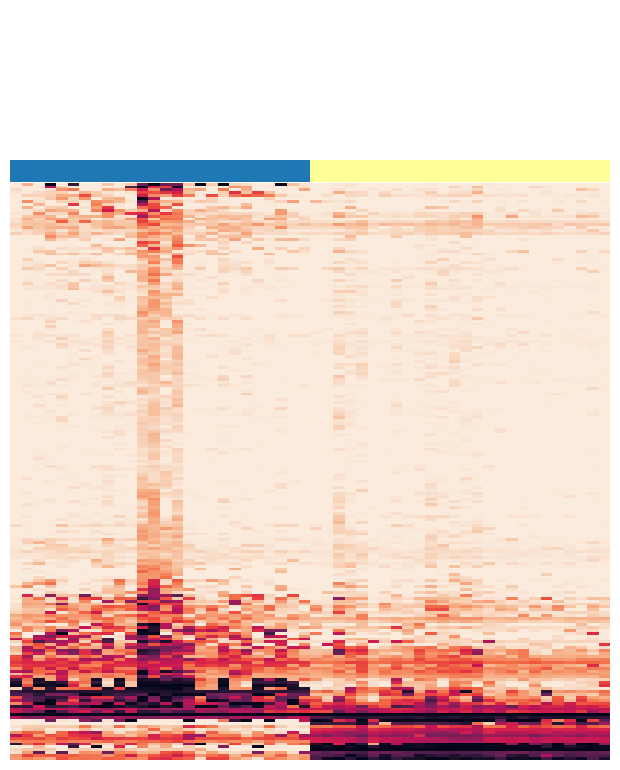

In [47]:
CovPlotter(cov=l.cov, colormap=colormap).clustermap(figsize=(8, 8), annotate=False);

We also add a histogram of the mean difference in coverage between north and south samplesets as some of the top-loading genes show 

In [48]:
CovPlotter(cov=l.cov, colormap=colormap).dhist(pair=["north", "south"])

:Histogram   [diff]   (Count)

##### Discretized gene feature

We perform an identical analysis on discretized gene features.

In [49]:
l = PCALoadings(pca_d["discretized/gene/False"])

In [50]:
l.hist(pcs=["PC1", "PC2", "PC3"], width=400).cols(3)

:NdLayout   [Variable]
   :Histogram   [PC3]   (Count)

For the discretized set, PC1 is the component of interest.

In [51]:
pc = ["PC1"]
tl_d = l.top_loadings(pc, signif=0.01)

We add a top loadings table with additional columns `north` and `south` that summarize the total present/absences for `north` and `south`. The table is ordered in ascending loadings order (`PC1` column).

In [52]:
columns = pc + ["north", "south", "north-south", "eggnog_description"]
columns = columns + [x for x in tl_d.head().columns if x not in columns + ["width"]]
panel_table(tl_d[columns], "loadings_discretized_gene.csv", pagination="remote", page_size=10)

Row
    [0] Column
        [0] TextInput(name='Enter filename', value='loadings_discretized_gene...)
        [1] Button(name='Download table')
    [1] Tabulator(page_size=10, pagination='remote', value=                          ...)

At first glance, it seems the discretized set is picking up shorter genes. See comparison section further down.

In [53]:
CovPlotter(cov=l.cov, colormap=colormap).heatmap(height=500, width=600)

:HeatMap   [sample,gene]   (value)

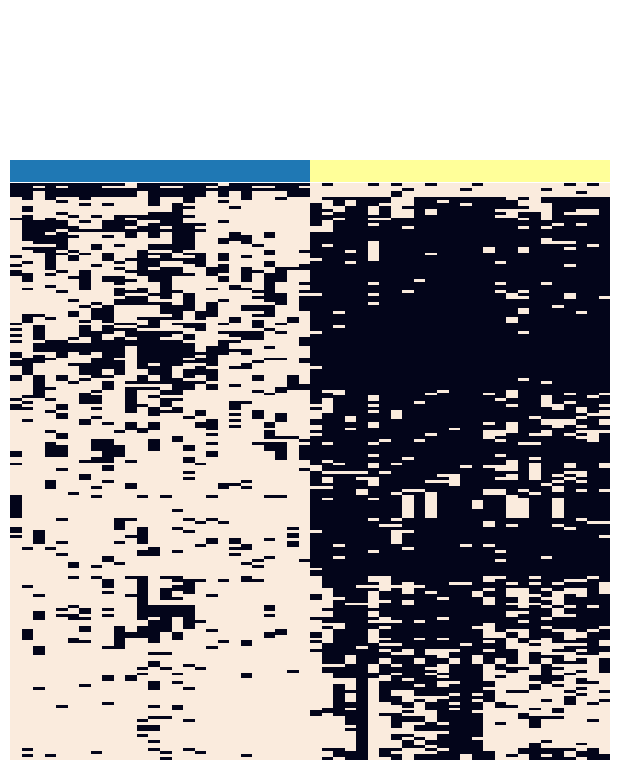

In [54]:
CovPlotter(cov=l.cov, colormap=colormap).clustermap(figsize=(8, 8));

In [55]:
CovPlotter(cov=l.cov).dhist(pair=["north", "south"])

:Histogram   [diff]   (Count)

##### Discretized, two-component loading

Looking at the PCA plots, it seems the best separation for the discretized analyses is actually a combination of PC1 and PC2. We include this analysis here for comparison.

In [56]:
pc = ["PC1", "PC2"]
tl_d2 = l.top_loadings(pc, signif=0.01)

In [57]:
columns = pc + ["north", "south", "north-south", "eggnog_description"]
columns = columns + [x for x in tl_d2.head().columns if x not in columns + ["width"]]
panel_table(tl_d2[columns], "loadings_discretized_gene_pc1_pc2.csv", pagination="local", page_size=10)

Row
    [0] Column
        [0] TextInput(name='Enter filename', value='loadings_discretized_gene...)
        [1] Button(name='Download table')
    [1] Tabulator(page_size=10, pagination='local', value=                          ...)

In [58]:
CovPlotter(cov=l.cov).heatmap(height=500, width=600)

:HeatMap   [sample,gene]   (value)

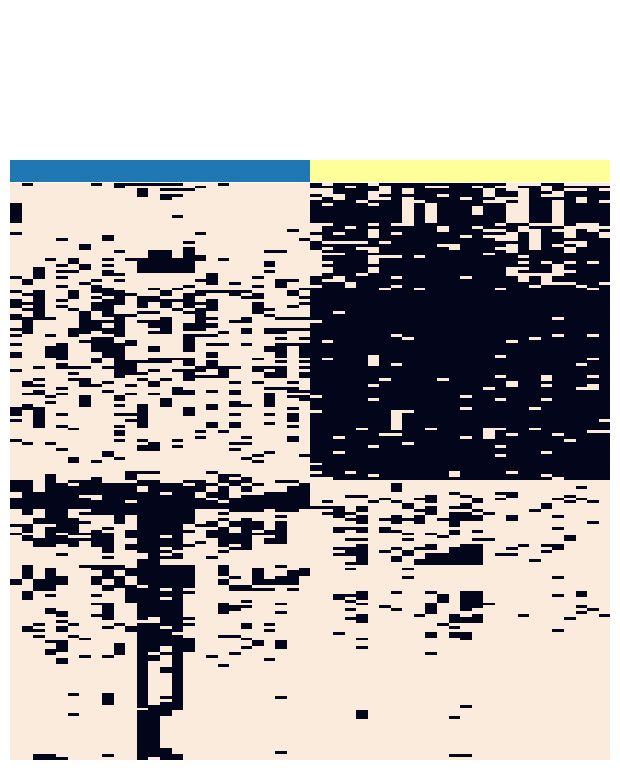

In [59]:
CovPlotter(cov=l.cov, colormap=colormap).clustermap(figsize=(8, 8));

In [60]:
CovPlotter(cov=l.cov).dhist(pair=["north", "south"])

:Histogram   [diff]   (Count)

#### PLS-DA


In [61]:
pls = []
for ft in tqdm(features):
    pls.append(PLSDA(results[ft]))
    pls.append(PLSDA(results[ft].normalize()))
    pls.append(PLSDA(results[ft].discretize()))
    pls.append(PLSDA(results[ft].randomize()))
    pls.append(PLSDA(results[ft].normalize().randomize()))

100%|███████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:33<00:00,  5.64s/it]


In [62]:
pls_d = {f"{p.type}/{p.feature}/{p.randomized}":p for p in pls}

In [63]:
plots = []
for k, x in pls_d.items():
    samplesets = ns_null_samplesets if x.feature == "random" else ns_samplesets
    plots.append(PLSDAPlotter(model=x, samplesets=samplesets, kwargs={"scale": 2, "size": "mean", "hover_cols": ["Scilife-ID", "sampleset", "Longitude", "Latitude", "mean", "batch"], 'height': 400, 'width': 400}, annotation=ssannot, colormap=colormap, bgcolor="white"))
samplesets = ns_samplesets

In [64]:
plist = [p.scatter(tools=["box_select"], label=p.model.type, legend=False, fontsize={'title': '10pt'}) for p in plots]
hv.Layout(plist).cols(5)

:Layout
   .Scatter.Raw.I           :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.I    :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.I   :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.II          :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.II   :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.III         :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.III  :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.II  :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.IV          :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.IV   :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.V           :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.V    :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.III :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.VI          :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.VI   :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.VII         :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.VII  :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.IV  :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.VIII        :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.VIII :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.IX          :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.IX   :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.V   :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.X           :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.X    :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.XI          :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.XI   :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.VI  :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.XII         :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.XII  :Scatter   [PLS1]   (PLS2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)

In [65]:
plist = [p.scatter(y="PLS3", x="PLS2", tools=["box_select"], label=p.model.type, legend=False, fontsize={'title': '10pt'}) for p in plots]
hv.Layout(plist).cols(5)

:Layout
   .Scatter.Raw.I           :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.I    :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.I   :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.II          :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.II   :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.III         :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.III  :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.II  :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.IV          :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.IV   :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.V           :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.V    :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.III :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.VI          :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.VI   :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.VII         :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.VII  :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.IV  :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.VIII        :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.VIII :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.IX          :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.IX   :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.V   :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.X           :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.X    :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.XI          :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.XI   :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Discretized.VI  :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Raw.XII         :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.Normalized.XII  :Scatter   [PLS2]   (PLS3,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)

#### PLS-DA Loadings

In [66]:
l = PLSDALoadings(pls_d["normalized/gene/False"])

In [67]:
l.hist(pcs=["PLS1", "PLS2", "PLS3"], width=400).cols(3)

:NdLayout   [Variable]
   :Histogram   [PLS3]   (Count)

From the scatter plots above both PLS1 and PLS2 contribute to the separation of normalized samples.

In [68]:
pc = ["PLS1", "PLS2"]
pls_tl_n = l.top_loadings(pc, signif=0.01)

We add a top loadings table with additional columns `north` and `south` that summarize the mean normalized coverages for `north` and `south`. The table is ordered in ascending loadings order (`PC2` column).

In [69]:
columns = pc + ["magnitude", "north", "south", "north-south", "eggnog_description"]
columns = columns + [x for x in pls_tl_n.head().columns if x not in columns + ["width"]]
df = pls_tl_n[columns]
panel_table(df, "plsda_loadings_normalized_gene_pls1_pls2.csv", page_size=10, pagination='local')

Row
    [0] Column
        [0] TextInput(name='Enter filename', value='plsda_loadings_normalized...)
        [1] Button(name='Download table')
    [1] Tabulator(page_size=10, pagination='local', value=                          ...)

In [70]:
CovPlotter(cov=l.cov, colormap=colormap).heatmap(height=500, width=600)

:HeatMap   [sample,gene]   (value)

We do the same for discretized. Here it is the PLS1 component that is the main driver.

In [71]:
l = PLSDALoadings(pls_d["discretized/gene/False"])

In [72]:
l.hist(pcs=["PLS1", "PLS2", "PLS3"], width=400).cols(3)

:NdLayout   [Variable]
   :Histogram   [PLS3]   (Count)

In [73]:
pc = ["PLS1"]
pls_tl_d = l.top_loadings(pc, signif=0.01)

In [74]:
columns = pc + ["magnitude", "north", "south", "north-south", "eggnog_description"]
columns = columns + [x for x in pls_tl_d.head().columns if x not in columns + ["width"]]
df = pls_tl_d[columns]
panel_table(df, "plsda_loadings_discretized_gene_pls1.csv", page_size=10, pagination='local')

Row
    [0] Column
        [0] TextInput(name='Enter filename', value='plsda_loadings_discretize...)
        [1] Button(name='Download table')
    [1] Tabulator(page_size=10, pagination='local', value=                          ...)

In [75]:
CovPlotter(cov=l.cov, colormap=colormap).heatmap(height=500, width=600)

:HeatMap   [sample,gene]   (value)

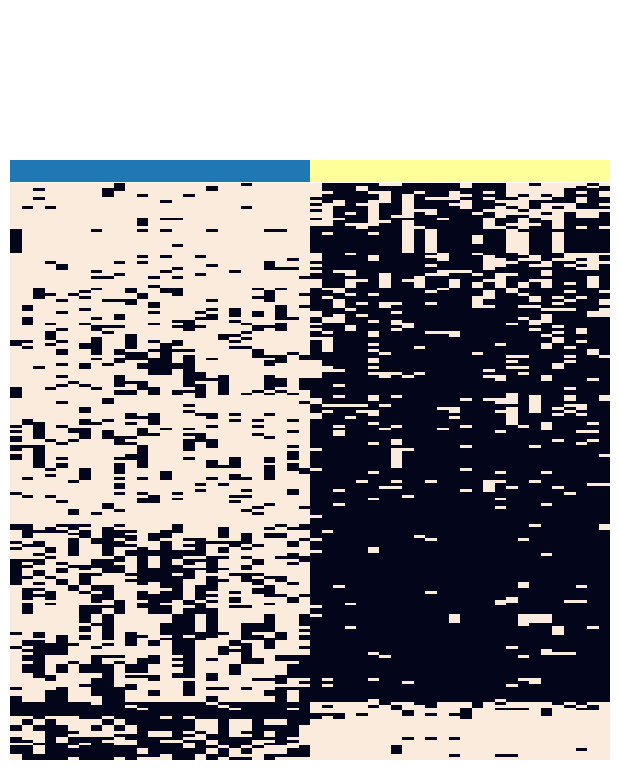

In [76]:
CovPlotter(cov=l.cov, colormap=colormap).clustermap(figsize=(8, 8));

#### Comparison of loadings results


We finish by comparing the distribution of widths and the overlap of found features.

In [77]:
tl_d["type"] = "discretized"
tl_n["type"] = "normalized"
tl_d2["type"] = "discretized2"
pls_tl_n["type"] = "pls_normalized"
pls_tl_d["type"] = "pls_discretized"
pd.concat((tl_d, tl_d2, tl_n, pls_tl_n, pls_tl_d)).hvplot.box(y="width", by="type").opts(logy=True)

:BoxWhisker   [type]   (width)

Finally the overlap between two sets as a fraction is

In [78]:
indices = [set(tl_d.index), set(tl_n.index), set(tl_d2.index), set(pls_tl_n.index), set(pls_tl_d.index)]
n = tl_d.shape[0]

In [79]:
labels = ["discretized", "normalized", "discretized2", "pls_normalized", "pls_discretized"]
pd.options.display.float_format = '{:,.1f}'.format
pd.DataFrame(np.array([len(x.intersection(y))/n*100 for i,x in enumerate(indices) for j,y in enumerate(indices)]).reshape(5,5), columns=labels, index=labels)

,discretized,normalized,discretized2,pls_normalized,pls_discretized
discretized,100.0,4.0,47.5,3.0,69.2
normalized,4.0,100.0,9.6,8.1,5.6
discretized2,47.5,9.6,100.0,2.5,55.6
pls_normalized,3.0,8.1,2.5,100.0,2.5
pls_discretized,69.2,5.6,55.6,2.5,100.0


Only 5-10% of top loadings are common to normalized and discretized analyses, whereas almost 50% agree for the two discretized analyses. pls_discretized and discretized are in good agreement.

### Highcov

In [80]:
hc_results = {}
hc_cdata = {}
samplesets = highcov_sampleset
for ft in tqdm(["gene", "pseudogene"]):    
    ss = samplesets["highcov"]
    hc_cdata[ft] = load_coverage_data(samples=ss, feature=ft, home=CONIFER_HOME, gene_filter=rna_genes)
    hc_results[ft] = Coverage(hc_cdata[ft], feature=ft, samplesets=samplesets, annotation=geneannot)

100%|██████████████████████████████████████████████████████████████████████████████████████| 2/2 [05:02<00:00, 151.04s/it]


### P.abies

In [81]:
pa_results = {}
pa_cdata = {}
samplesets = pabies_sampleset
for ft in tqdm(["gene"]):    
    ss = samplesets["pabies"]
    pa_cdata[ft] = load_coverage_data(samples=ss, feature=ft, home=CONIFER_HOME, gene_filter=rna_genes)
    pa_results[ft] = Coverage(pa_cdata[ft], feature=ft, samplesets=samplesets, annotation=geneannot)

100%|██████████████████████████████████████████████████████████████████████████████████████| 1/1 [05:19<00:00, 319.10s/it]


In [82]:
pa_pca = PCA(pa_results["gene"].normalize())
plot = PCAPlotter(model=pa_pca, samplesets=pabies_sampleset,
                        kwargs={"scale": 2, "size": "mean", "hover_cols": ["Scilife-ID", "sampleset", "Longitude", "Latitude", "mean", "batch"], 'height': 400, 'width': 400}, 
                        annotation=ssannot, colormap=colormap, bgcolor="white",
                        )
hv.Layout([plot.scatter(), plot.scatter(x="PC3", y="PC4")])

:Layout
   .Scatter.I  :Scatter   [PC1]   (PC2,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)
   .Scatter.II :Scatter   [PC3]   (PC4,sampleset,mean,Scilife-ID,Longitude,Latitude,batch)

## Manuscript figures

Save relevant figures as SVG.

In [151]:
from bokeh.io import export_svg, export_png

In [158]:
def export_fig(p, stem):
    export_svg(p, filename=f"{stem}.svg")
    export_png(p, filename=f"{stem}.png")
    

### Discretized gene

The default cutoff for discretization is 0.2 and has been used unless otherwise stated. Redo PLS-DA analysis for cross validation. By default the PLSDA cross validation function runs the repeated K-fold cross validator and scored using negative mean squared error. We here split the cross validation data sets five times.

In [84]:
model = PLSDA(results["gene"].discretize())
loss, predict = model.cross_validation(n_splits=5)

INFO:conifer.presabs:Running cross-validation with parameters n_splits=5, n_repeats=10, max_comp=20
100%|█████████████████████████████████████████████████████████████████████████████████████| 19/19 [03:11<00:00, 10.10s/it]


We plot the loss function to determine the optimal number of components.

In [85]:
pd.DataFrame({"loss":loss, "n_component": np.arange(1, len(loss) + 1)}).hvplot(x="n_component", y="loss")

:Curve   [n_component]   (loss)

The minimum occurs for `n_component=3`.

In [86]:
pls_ms = PLSDA(results["gene"].discretize(), n_components=3)

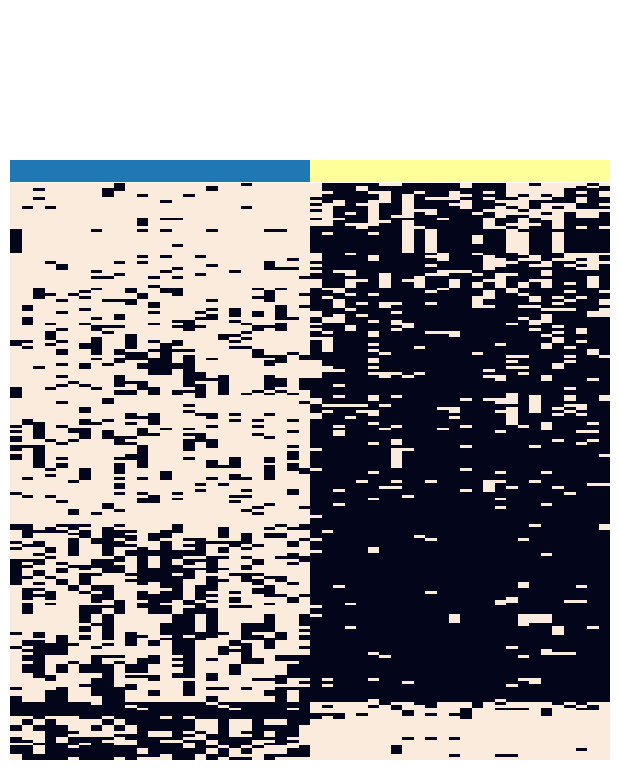

In [207]:
l = PLSDALoadings(pls_ms)
pc = ["PLS1"]
tl_d_gene = l.top_loadings(pc, signif=0.01)
p = CovPlotter(cov=l.cov, colormap=colormap).clustermap(figsize=(8, 8));
p.savefig("discretized_gene_pls_clustermap.svg")
p.savefig(MANUSCRIPT_FIGURES / "figure3c.gene.svg");
p.savefig(MANUSCRIPT_FIGURES / "figure3c.gene.png");

In [168]:
p = PLSDAPlotter(model=pls_ms, samplesets=ns_samplesets, kwargs={"fontscale": 2, "size": 100, "hover_cols": ["Scilife-ID", "sampleset", "Longitude", "Latitude", "mean", "batch"], 'height': 800, 'width': 800}, annotation=ssannot, colormap=colormap, bgcolor="white")
plot = p.scatter(title="", legend=False).opts(toolbar=None)
export_fig(hv.render(plot), stem="discretized_gene_pls");

In [195]:
p = PCAPlotter(model=pca_d["discretized/gene/False"], samplesets=ns_samplesets, kwargs={"fontscale": 2, "size": 100, "hover_cols": ["Scilife-ID", "sampleset", "Longitude", "Latitude", "mean", "batch"], 'height': 800, 'width': 800}, annotation=ssannot, colormap=colormap, bgcolor="white")
plot = hv.render(p.scatter(title="", legend=False).opts(toolbar=None))
export_fig(plot, stem=MANUSCRIPT_FIGURES / "discretized_gene_pca.S38c");

In [196]:
p = PCAPlotter(model=pca_d["discretized/pseudogene/False"], samplesets=ns_samplesets, kwargs={"fontscale": 2, "size": 100, "hover_cols": ["Scilife-ID", "sampleset", "Longitude", "Latitude", "mean", "batch"], 'height': 800, 'width': 800}, annotation=ssannot, colormap=colormap, bgcolor="white")
plot = hv.render(p.scatter(title="b", legend=False).opts(toolbar=None)) 
export_fig(plot, stem=MANUSCRIPT_FIGURES / "discretized_pseudogene_pca.S38d");

### Discretized CDS

In [117]:
model = PLSDA(results["CDS"].discretize())
loss, predict = model.cross_validation(n_splits=5)

INFO:conifer.presabs:Running cross-validation with parameters n_splits=5, n_repeats=10, max_comp=20
100%|█████████████████████████████████████████████████████| 19/19 [03:06<00:00,  9.83s/it]


We plot the loss function to determine the optimal number of components.

In [118]:
pd.DataFrame({"loss":loss, "n_component": np.arange(1, len(loss) + 1)}).hvplot(x="n_component", y="loss")

:Curve   [n_component]   (loss)

The minimum occurs for `n_component=3`.

In [119]:
pls_cds_ms = PLSDA(results["CDS"].discretize(), n_components=3)

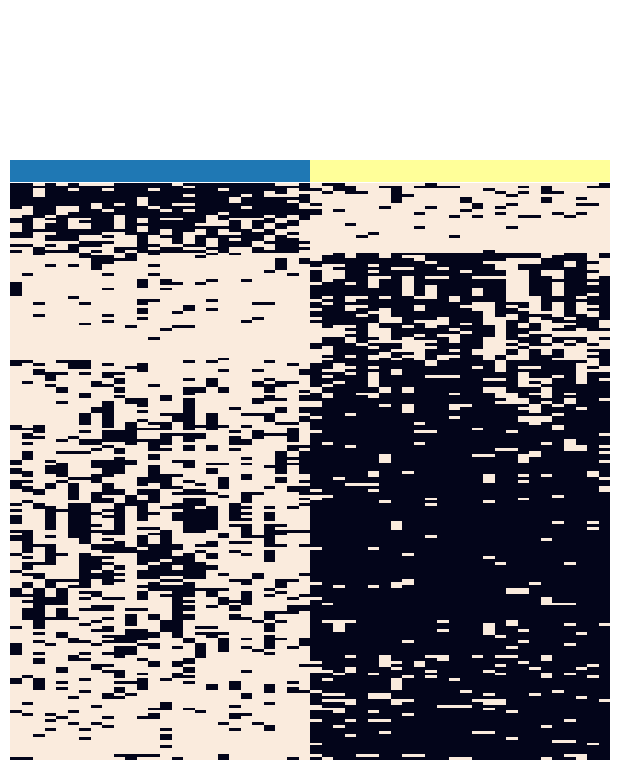

In [206]:
l = PLSDALoadings(pls_cds_ms)
pc = ["PLS1"]
tl_d_cds = l.top_loadings(pc, signif=0.01)
p = CovPlotter(cov=l.cov, colormap=colormap).clustermap(figsize=(8, 8));
p.savefig("discretized_cds_pls_clustermap.svg");
p.savefig(MANUSCRIPT_FIGURES / "figure3c.cds.svg");
p.savefig(MANUSCRIPT_FIGURES / "figure3c.cds.png");

In [203]:
help(p.savefig)

Help on method savefig in module seaborn.axisgrid:

savefig(*args, **kwargs) method of seaborn.matrix.ClusterGrid instance
    Save an image of the plot.

    This wraps :meth:`matplotlib.figure.Figure.savefig`, using bbox_inches="tight"
    by default. Parameters are passed through to the matplotlib function.



In [121]:
p = PLSDAPlotter(model=pls_cds_ms, samplesets=ns_samplesets, kwargs={"fontscale": 2, "size": 100, "hover_cols": ["Scilife-ID", "sampleset", "Longitude", "Latitude", "mean", "batch"], 'height': 800, 'width': 800}, annotation=ssannot, colormap=colormap, bgcolor="white")
plot = p.scatter(title="", legend=False)
export_svg(hv.render(plot), filename="discretized_CDS_pls.svg");

In [190]:
tl_d_cds.to_csv(MANUSCRIPT_FIGSHARE / "presabs" / "tbl-pls-da-discretized-CDS-top-loadings.csv", sep=",")

In [194]:
tl_d_cds_readme = """# Top loadings for PLS-DA, discretized CDS regions

Top loadings for PLS-DA discretized CDS regions. CDS regions were classified as present (=1) if at least 20% of the bases had a 
sequencing coverage >= 3X. Output columns include width of region, id, and annotation information from eggnog and interpro.

The north / south columns list how many individuals were scored as having the feature present, whereas the north-south column 
corresponds to the difference between north and south. 

"""
with open(MANUSCRIPT_FIGSHARE / "presabs" / "tbl-pls-da-discretized-CDS-top-loadings.README.md", "w") as fh:
    fh.write(tl_d_cds_readme)

In [186]:
p = PCAPlotter(model=pca_d["discretized/CDS/False"], samplesets=ns_samplesets, kwargs={"fontscale": 2, "size": 100, "hover_cols": ["Scilife-ID", "sampleset", "Longitude", "Latitude", "mean", "batch"], 'height': 800, 'width': 800}, annotation=ssannot, colormap=colormap, bgcolor="white")
plot = hv.render(p.scatter(title="b", legend=False).opts(toolbar=None)) 
export_fig(plot, stem=MANUSCRIPT_FIGURES / "discretized_CDS_pca.S38b");

### Comparison gene vs CDS

In [123]:
len(set(tl_d_gene.index.get_level_values("gene")).intersection(tl_d_cds.index.get_level_values("gene")))

112

In [124]:
len(set(tl_d_gene.index.get_level_values("gene")).difference(tl_d_cds.index.get_level_values("gene")))

86

In [125]:
len(tl_d_gene.index.get_level_values("gene")), len(tl_d_cds.index.get_level_values("gene"))

(198, 198)

### Individuals vs proportion present (Fig S38a)

Plot number of individuals against the proportion of features (genes/pseudogenes) classified as present/absent

In [126]:
cov = hc_results["gene"].discretize()
percentiles = np.arange(0, 1, 0.01)
i = 0
gene = pd.concat([cov.data.agg(np.sum, axis=i) / cov.data.shape[i] > p for p in percentiles], axis=1).agg(np.sum, axis=0)

In [127]:
cov = hc_results["pseudogene"].discretize()
percentiles = np.arange(0, 1, 0.01)
i = 0
pseudogene = pd.concat([cov.data.agg(np.sum, axis=i) / cov.data.shape[i] > p for p in percentiles], axis=1).agg(np.sum, axis=0)

In [128]:
df = pd.concat([gene, pseudogene], axis=1)
df.columns = ["gene", "pseudogene"]
df = pd.DataFrame(df.stack()).reset_index()
df.columns = ["index", "feature", "count"]

In [178]:
backend_opts = {
            'plot.outline_line_width': 1,
            'plot.outline_line_color': 'black',
            'plot.xaxis.minor_tick_line_color': None,
            'plot.yaxis.minor_tick_line_color': None,
            'plot.axis.axis_label_text_font_style': 'bold',
        'plot.title.text_font_size': "28pt",

}
p = df.hvplot.line(by="feature", xlabel="features present (%)", title="a",
                   fontscale=2, width=800, height=600).opts(
    backend_opts=backend_opts, legend_position="bottom_left", toolbar=None)
plot = hv.render(p)
export_fig(plot, stem=MANUSCRIPT_FIGURES / "proportion_present_highcov.S38a");

### Boxplot of individuals present / absent (Fig S38c)

This plot is made in R.